<a href="https://colab.research.google.com/github/galbendavids/deep_learning_projects/blob/main/GreenOnyx_Gal_Shlomo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Task #1 – Process control

 Process Control Considering the goal of the sampling procedure, please review the parameters collected by the technician (section 3b-d) and; (1) Suggest any additional parameters the technician should document and explain why. (2) Provide any feedback on the sampling procedure itself, the current parameters and if required, suggest fixes.

**Task #1 - answer**

i believe those parameters can be useful in order to track the health of the cratures
t
*  temperature - as low or high temperature can present something wrong with the machine or the enviroment

*   count of creatures in each "main" color like dark green, light green and yelloish - as the colors and count both can present the reproduce and health of the creatures.


*   auto sampling of color - imagine take the whole picture and convert it into the 1 pixel - waht pixel would it be (like center of mass in physics, but in rgb) - i think it can present health
*   auto sampling of clariry - it can help us to eliminate some images with low quaity, clairty or strange light. so we wont get grabage data into the system.
*   evaluation of the worker - i believe that even thoghth the technician is not "biological" expert - his evaluation can help us understand if there are features that we miss, and to keep him active and responsible in the loop. it is important to connect evaluation of the worker with worker id so we can eliminate inter-workers variation.it can help us understand if there are fails that are connected to some of negligence of dome workers.
*   volume measurment from a sample (mean volume, sd volume) - i am pretty sure that big volumes against small volume creatures can represnt health.




# Task #2 – CV

Please implement a module, that extracts the features of all creatures within a sample. The end-goal is to determine the health of the creatures within the sample. You can assume that the appearance of the creatures is highly correlated with their health. Some pre-requisites/constraints:
The module should be implemented in python and you can use any open source packages.
The extracted features of every creature are up to you, please provide documentation to explain why and how each feature is extracted.
Take into consideration the final task and how if at all, it affects the feature extraction module.
Runtime is not limited.




**Task #2 - answer**

analysis and extraction of features out of images, steps:

1.   read images
2.   manually isolate everything out of the "circle"
3.   count creatures of each main color


Image 1: shape (3712, 4180, 3)


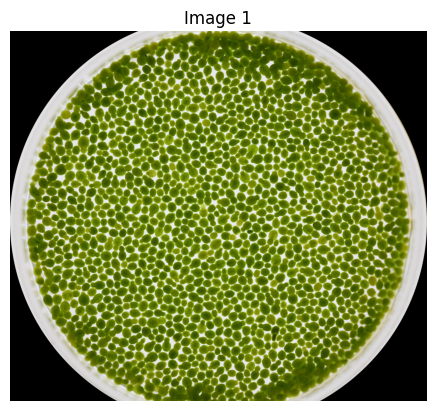

Image 2: shape (3712, 4180, 3)


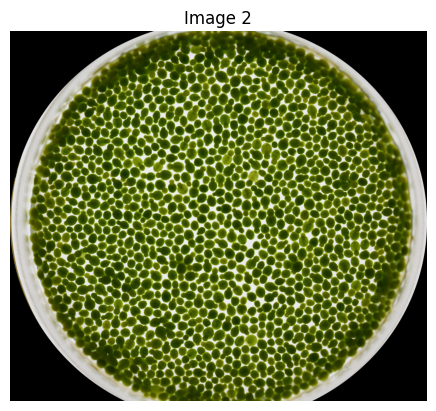

Image 3: shape (3712, 4129, 3)


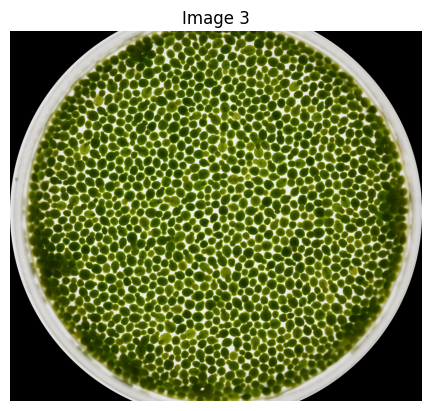

Image 4: shape (3712, 4163, 3)


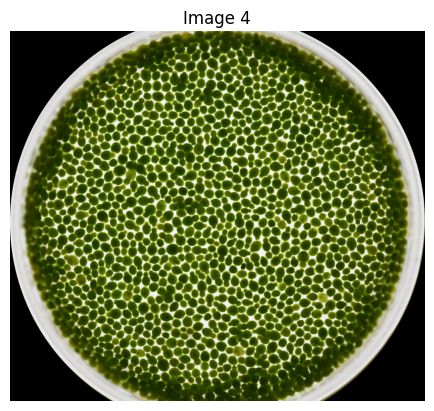

In [ ]:

#use pillow libray for reading pictures
#!pip install pillow numpy

#**** i have manually edited the photos so we wont take into consideration the yellow-orange background


import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        if filename.endswith(".jpg"):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path)
            img_array = np.array(img)
            images.append(img_array)
    return images

folder_path = '/content/drive/MyDrive/greenonyx'
images_array = load_images_from_folder(folder_path)

# Example: Print the shape of each image array
for i, img in enumerate(images_array):
    print(f"Image {i+1}: shape {img.shape}")
    plt.figure()
    plt.imshow(img)
    plt.axis('off')  # Hide the axes for a cleaner look
    plt.title(f'Image {i+1}')
    plt.show()




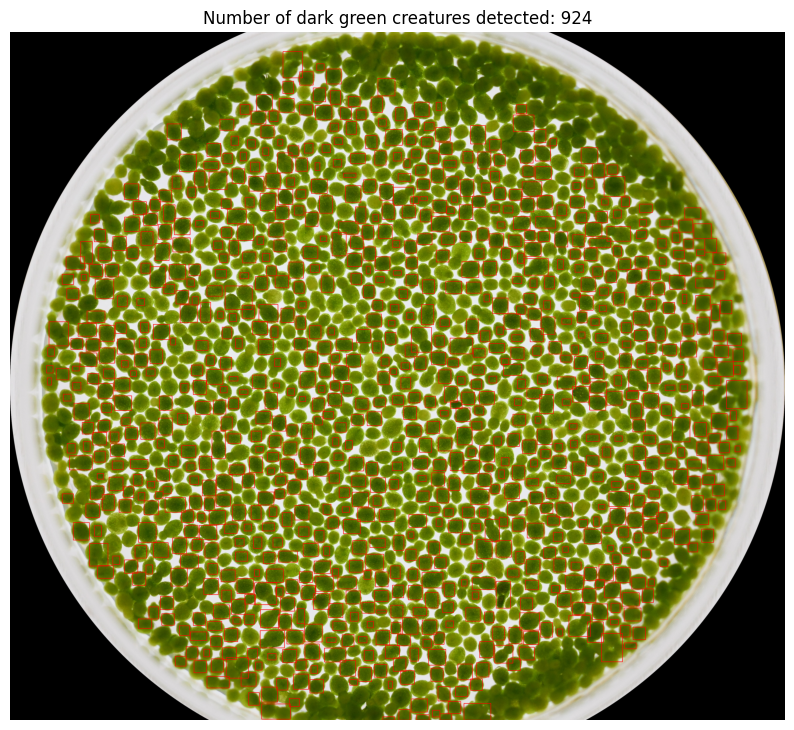

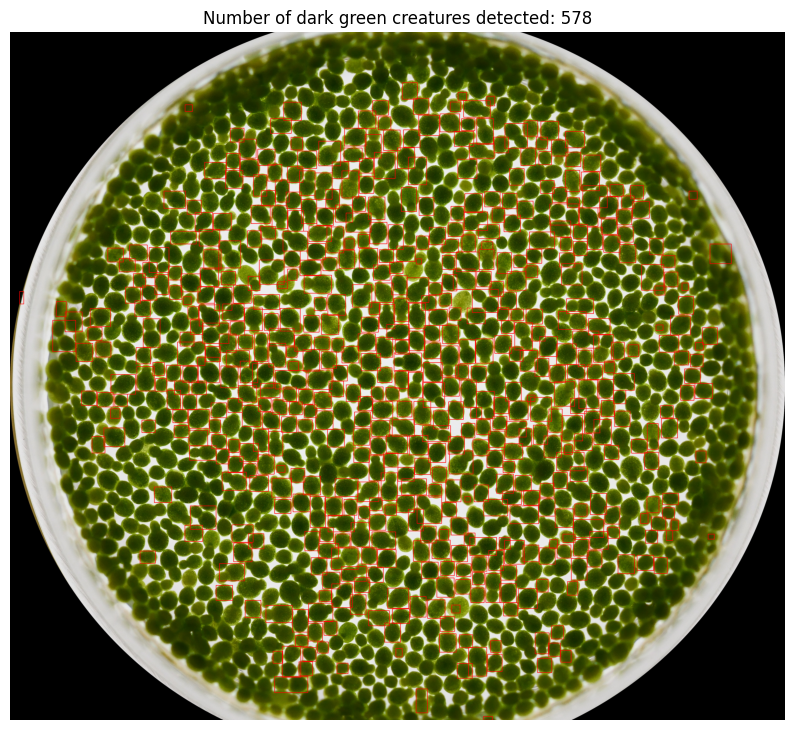

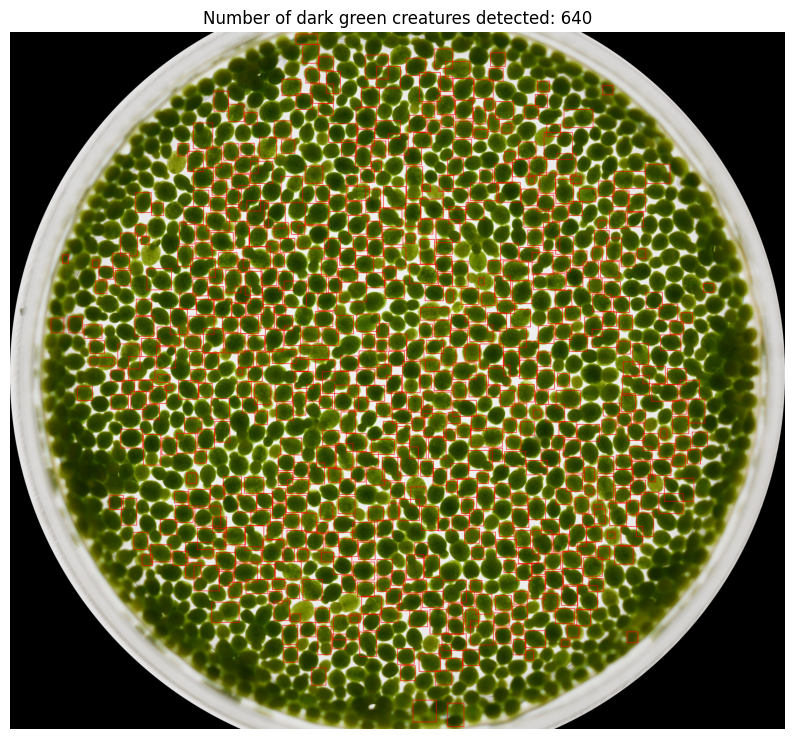

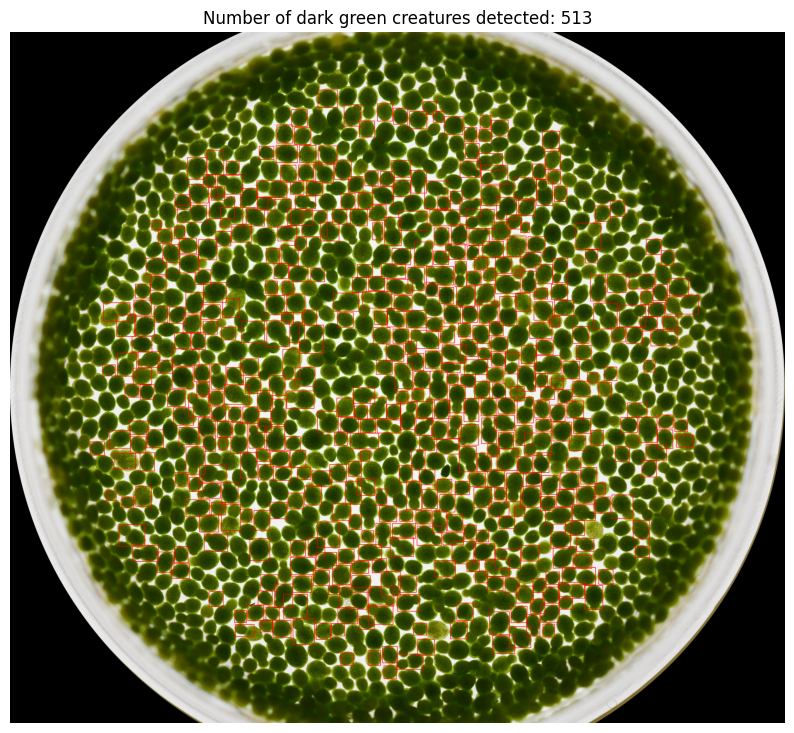

In [ ]:
#count the dark green creatures

import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def detect_and_frame_elements(image, min_size, max_size):
    # Convert PIL image to a NumPy array
    image_np = np.array(image)

    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image_np, cv2.COLOR_RGB2HSV)

    # Define the range for dark green color
    lower_dark_green = np.array([35, 40, 20])  # Adjusted lower range for dark green
    upper_dark_green = np.array([85, 255, 100])  # Adjusted upper range for dark green

    # Threshold the HSV image to get only dark green colors
    mask = cv2.inRange(hsv, lower_dark_green, upper_dark_green)

    # Apply GaussianBlur to the mask to reduce noise
    blurred = cv2.GaussianBlur(mask, (5, 5), 0)

    # Use morphological operations to close gaps in contours and remove small noise
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    closed = cv2.morphologyEx(blurred, cv2.MORPH_CLOSE, kernel, iterations=2)
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours
    contours, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw rectangles around detected dark green points
    framed_image = image_np.copy()
    count = 0
    for contour in contours:
        area = cv2.contourArea(contour)
        if min_size < area < max_size:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(framed_image, (x, y), (x + w, y + h), (255, 0, 0), 2)
            count += 1

    return framed_image, count

def display_image_with_count(image, framed_image, count):
    plt.figure(figsize=(10, 10))
    plt.imshow(framed_image)
    plt.axis('off')
    plt.title(f'Number of dark green creatures detected: {count}')
    plt.show()

# Example usage with images_array
# Define the minimum and maximum size for the creatures in pixels
min_size = 500  # Minimum size in pixels
max_size = 10000  # Maximum size in pixels

for image in images_array:
    framed_image, count = detect_and_frame_elements(image, min_size, max_size)
    display_image_with_count(image, framed_image, count)



lets continute on to the second feature - color
the steps:

- Convert the image to the HSV color space, which makes it
easier to isolate specific colors.
- Define a range for the yellowish-green color in the HSV space.
- Create a mask that isolates only the yellowish-green balls.

it looks like im repeating the same funciton but i needed to fine tune some arguments each time so it was much easier to write the code that way





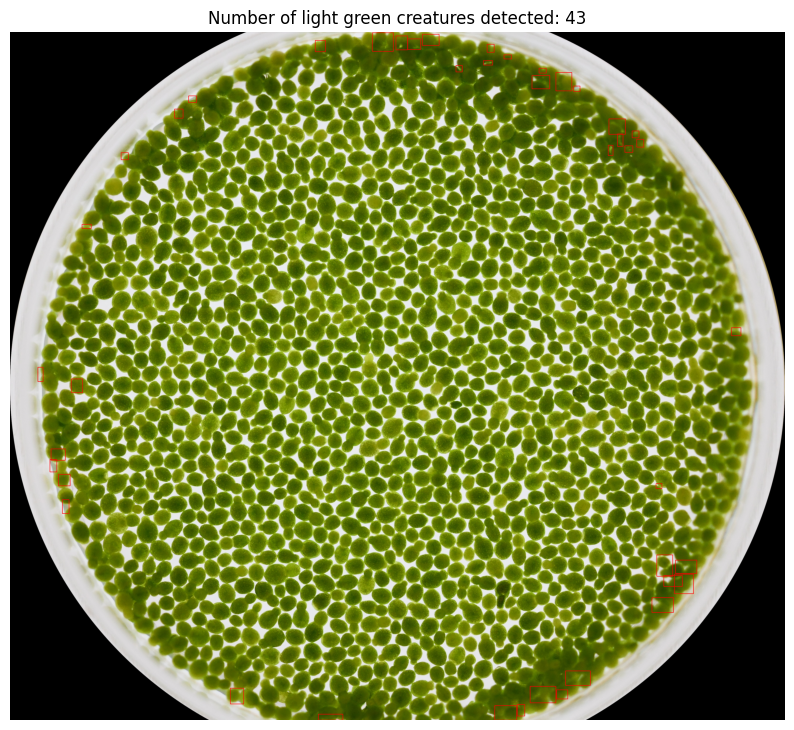

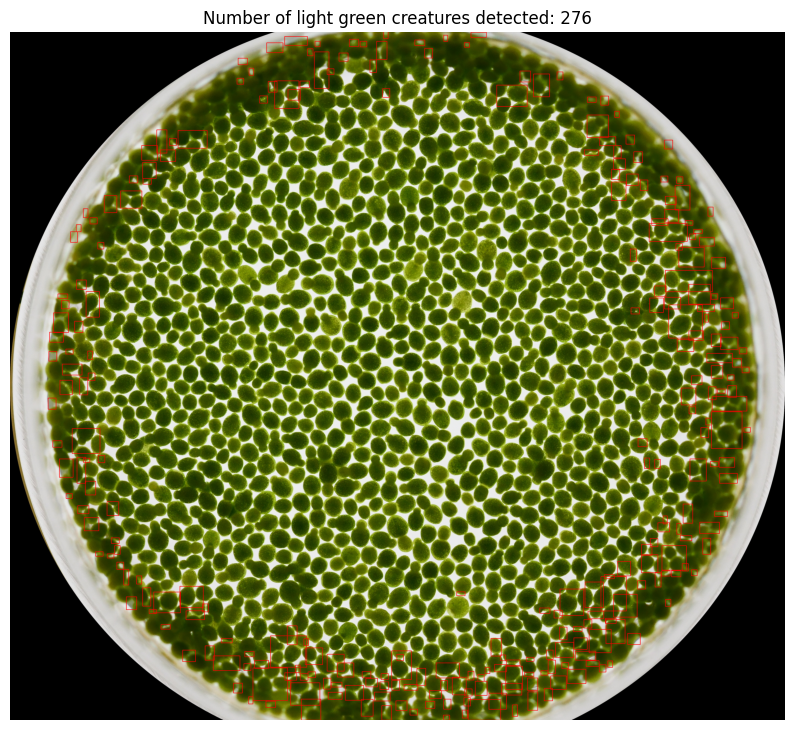

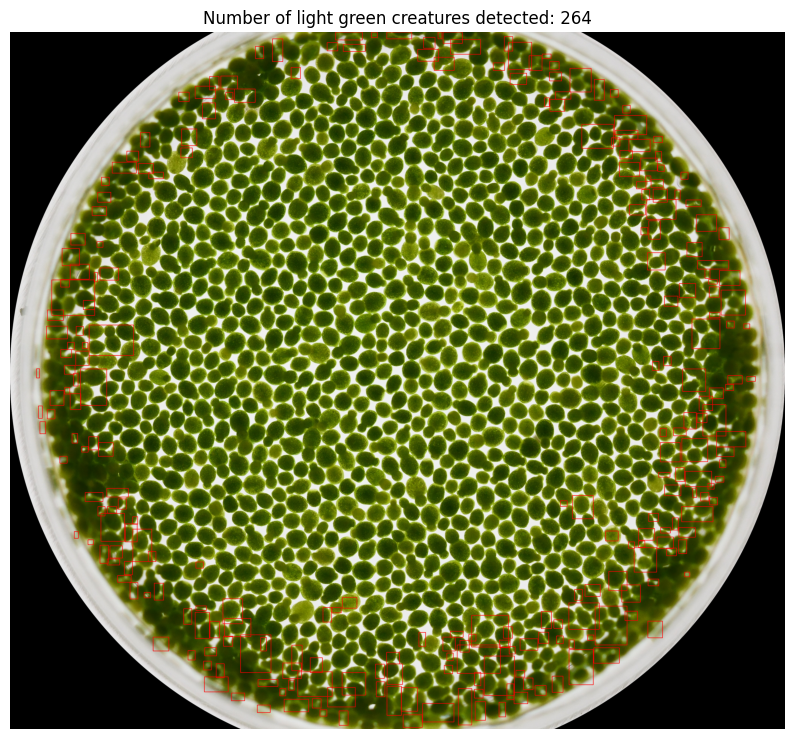

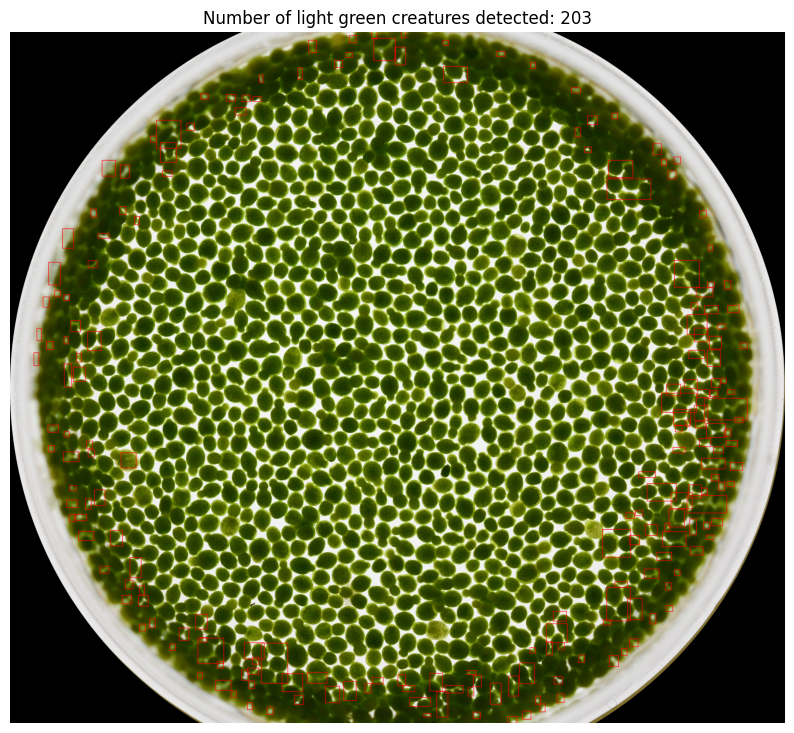

In [ ]:
#count the light green creatures

import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def detect_and_frame_elements(image, min_size, max_size):
    # Convert PIL image to a NumPy array
    image_np = np.array(image)

    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image_np, cv2.COLOR_RGB2HSV)

    # Define the range for light green color
    lower_light_green = np.array([35, 40, 100])  # Adjusted lower range for light green
    upper_light_green = np.array([85, 255, 255])  # Adjusted upper range for light green


    # Threshold the HSV image to get only dark green colors
    mask = cv2.inRange(hsv, lower_light_green, upper_light_green)

    # Apply GaussianBlur to the mask to reduce noise
    blurred = cv2.GaussianBlur(mask, (5, 5), 0)

    # Use morphological operations to close gaps in contours and remove small noise
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    closed = cv2.morphologyEx(blurred, cv2.MORPH_CLOSE, kernel, iterations=2)
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours
    contours, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw rectangles around detected dark green points
    framed_image = image_np.copy()
    count = 0
    for contour in contours:
        area = cv2.contourArea(contour)
        if min_size < area < max_size:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(framed_image, (x, y), (x + w, y + h), (255, 0, 0), 2)
            count += 1

    return framed_image, count

def display_image_with_count(image, framed_image, count):
    plt.figure(figsize=(10, 10))
    plt.imshow(framed_image)
    plt.axis('off')
    plt.title(f'Number of light green creatures detected: {count}')
    plt.show()

# Example usage with images_array
# Define the minimum and maximum size for the creatures in pixels
min_size = 500  # Minimum size in pixels
max_size = 10000  # Maximum size in pixels

for image in images_array:
    framed_image, count = detect_and_frame_elements(image, min_size, max_size)
    display_image_with_count(image, framed_image, count)


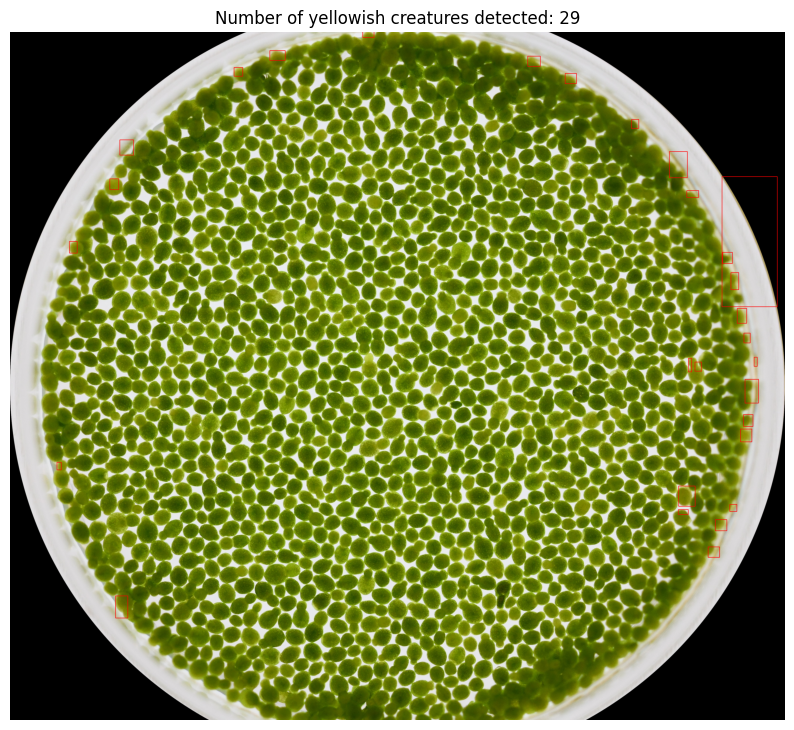

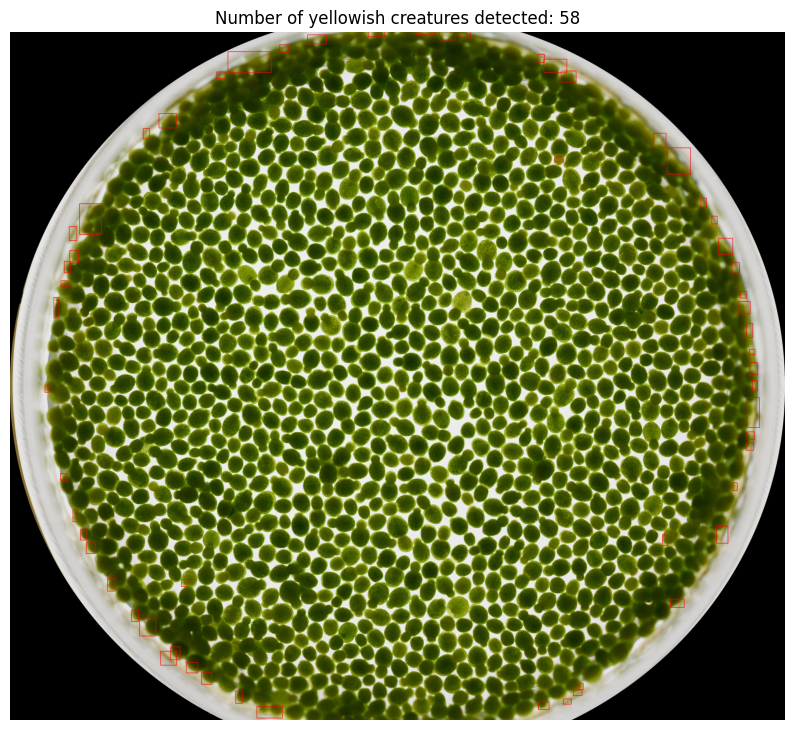

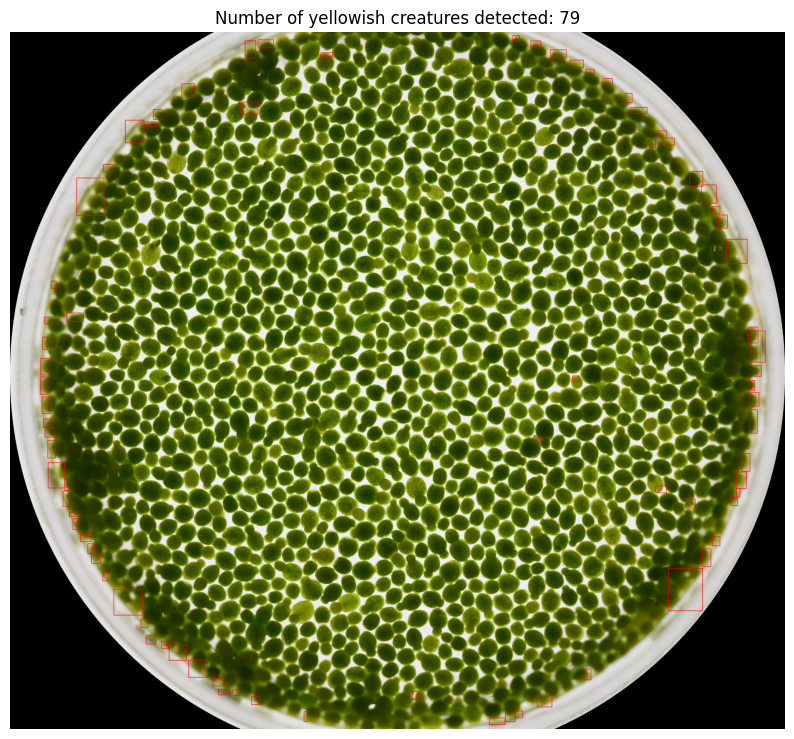

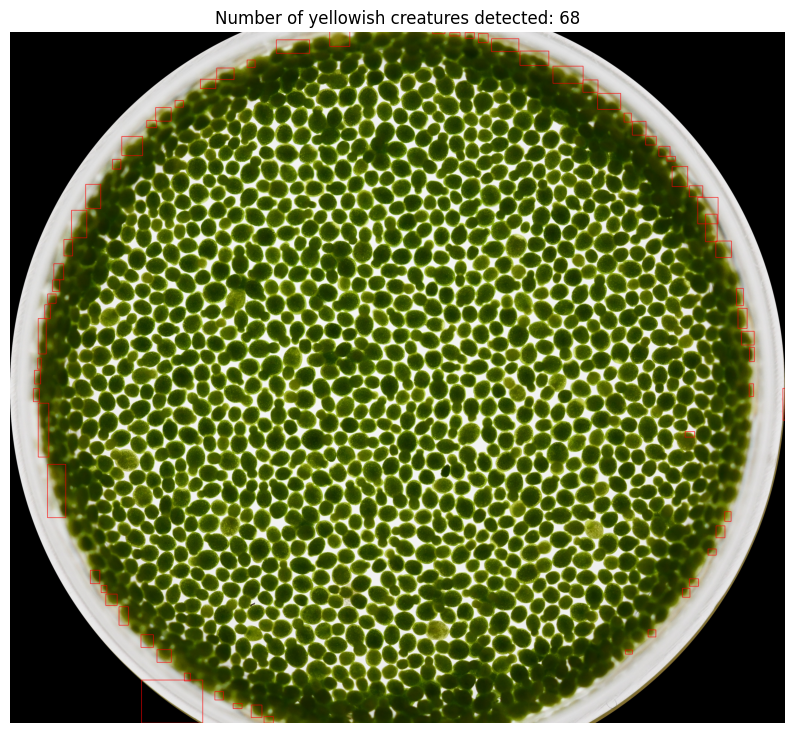

In [ ]:
#count the light green creatures

import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def detect_and_frame_elements(image, min_size, max_size):
    # Convert PIL image to a NumPy array
    image_np = np.array(image)

    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image_np, cv2.COLOR_RGB2HSV)

    # Define the range for yellow color
    lower_yellow = np.array([0, 100, 100])  # Adjusted lower range for yellow
    upper_yellow = np.array([30, 255, 255])  # Adjusted upper range for yellow

    # Threshold the HSV image to get only dark green colors
    mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

    # Apply GaussianBlur to the mask to reduce noise
    blurred = cv2.GaussianBlur(mask, (5, 5), 0)

    # Use morphological operations to close gaps in contours and remove small noise
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    closed = cv2.morphologyEx(blurred, cv2.MORPH_CLOSE, kernel, iterations=2)
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours
    contours, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw rectangles around detected dark green points
    framed_image = image_np.copy()
    count = 0
    for contour in contours:
        area = cv2.contourArea(contour)
        if min_size < area < max_size:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(framed_image, (x, y), (x + w, y + h), (255, 0, 0), 2)
            count += 1

    return framed_image, count

def display_image_with_count(image, framed_image, count):
    plt.figure(figsize=(10, 10))
    plt.imshow(framed_image)
    plt.axis('off')
    plt.title(f'Number of yellowish creatures detected: {count}')
    plt.show()

# Example usage with images_array
# Define the minimum and maximum size for the creatures in pixels
min_size = 500  # Minimum size in pixels
max_size = 7000  # Maximum size in pixels

for image in images_array:
    framed_image, count = detect_and_frame_elements(image, min_size, max_size)
    display_image_with_count(image, framed_image, count)


# Task #3 – Basic Analytics
Run your module on all provided samples and compare the features extracted from each sample. Compose a report (no more than a single page, including figures) comparing the samples, and addressing their variability (if any was found). Include any insights you might have, or additional comments.

### Task #3 - Answer

In [ ]:
import pandas as pd
data = {'dark_green_count': [924,578,640,513], 'light_green_count': [43,249,264,203],'yelloish_coung':[29,48,79,68]}
df = pd.DataFrame(data)
df

,dark_green_count,light_green_count,yelloish_coung
0,924,43,29
1,578,249,48
2,640,264,79
3,513,203,68


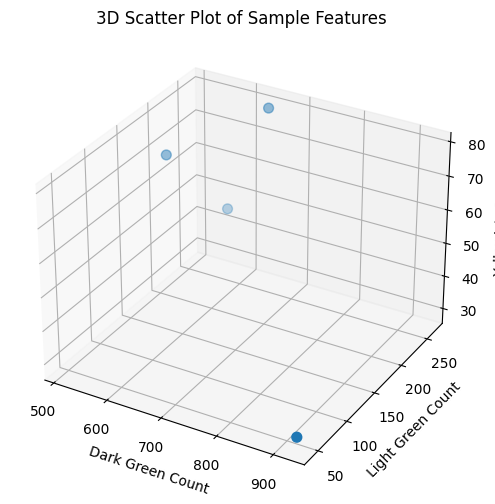

Correlation Matrix:
                   dark_green_count  light_green_count  yelloish_coung
dark_green_count           1.000000          -0.855367       -0.724128
light_green_count         -0.855367           1.000000        0.797770
yelloish_coung            -0.724128           0.797770        1.000000


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


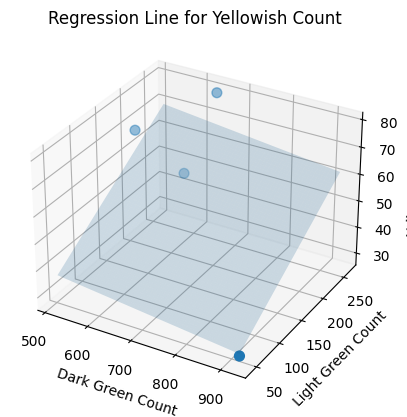

In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
df = pd.DataFrame(data)

# 3D Scatter Plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['dark_green_count'], df['light_green_count'], df['yelloish_coung'], s=50)
ax.set_xlabel('Dark Green Count')
ax.set_ylabel('Light Green Count')
ax.set_zlabel('Yellowish Count')
plt.title('3D Scatter Plot of Sample Features')
plt.show()

# Correlation Matrix
corr_matrix = df.corr()
print('Correlation Matrix:')
print(corr_matrix)

# Regression Line
from sklearn.linear_model import LinearRegression
model = LinearRegression()
X = df[['dark_green_count', 'light_green_count']]
y = df['yelloish_coung']
model.fit(X, y)

# Plot the regression line
ax = plt.axes(projection='3d')
ax.scatter(df['dark_green_count'], df['light_green_count'], df['yelloish_coung'], s=50)
x_surf, y_surf = np.meshgrid(np.linspace(df['dark_green_count'].min(), df['dark_green_count'].max(), 100), np.linspace(df['light_green_count'].min(), df['light_green_count'].max(), 100))
z_surf = model.predict(np.c_[x_surf.ravel(), y_surf.ravel()]).reshape(x_surf.shape)
ax.plot_surface(x_surf, y_surf, z_surf, alpha=0.2)
ax.set_xlabel('Dark Green Count')
ax.set_ylabel('Light Green Count')
ax.set_zlabel('Yellowish Count')
plt.title('Regression Line for Yellowish Count')
plt.show()


as the reader can see-
there is a "zero sum" realtion between each one of the count values.
when one of them increase - the other decrease.
the only "correlation" between features are the count of yelloish and the light green but it is artificial correlation as the features shared "color" range.

the first image (number 12) is considerd outlier by me as it is realtivley far from the others in each mathematic prespective.

if i had more time i would aim to:
- sample some creatures from each image and measure the volume, calculating mean volume and sd. for volumes within an image.

- improve the counting functions.

- complete the "basic analytics" part.


